ResNet et Inception ont été au cœur des avancées les plus importantes en matière de performances de reconnaissance d'images ces dernières années, avec de très bonnes performances à un coût de calcul relativement faible.
Inception-ResNet combine l'architecture Inception, avec des connexions résiduelles.

Inception-ResNet-v2 est un réseau neuronal convolutif. Le réseau a une profondeur de 164 couches et peut classer les images en 1000 catégories d'objets, telles que le clavier, la souris, le crayon et de nombreux animaux. En conséquence, le réseau a appris des représentations de caractéristiques riches pour une large gamme d'images. Le réseau a une taille d'entrée d'image de 299 par 299.

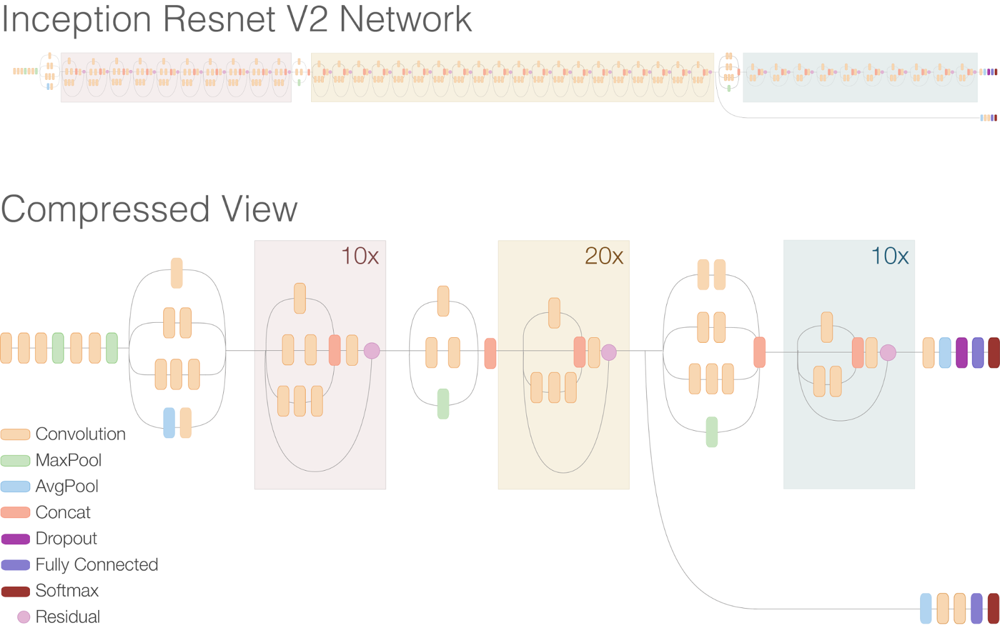

Nous avons modifié le modèle afin qu'il ne classe que 3 catégories. Cela implique que nous avons du réentrainer le modèle.

In [1]:
import glob
import matplotlib
from matplotlib import pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import imageio as im
from keras import models
from keras.models import Sequential
from keras.layers import Conv2D
from keras.layers import MaxPooling2D, MaxPool2D
from keras.layers import Flatten, AveragePooling2D
from keras.layers import Dense
from keras.layers import Dropout
from keras.preprocessing import image
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ModelCheckpoint
import cv2
import tensorflow as tf
import tensorflow.keras.backend as K

In [2]:
# Initialisation du modèle
model = Sequential()

In [3]:
# example of loading the vgg16 model
from tensorflow.keras.applications.inception_resnet_v2 import InceptionResNetV2
from tensorflow.keras.layers import Input
from keras.models import Model


# new_input = Input(shape=(180, 180, 3))
# # load model
# model = VGG16(include_top=True, weights=None, input_tensor=new_input, classes=3, classifier_activation="softmax")

def create_model(input_shape, n_classes, optimizer='rmsprop', fine_tune=0):

    # Include_top is set to False, in order to exclude the model's fully-connected layers.
    conv_base = InceptionResNetV2(include_top=False,
                     weights=None, 
                     input_shape=input_shape)
    
    # Defines how many layers to freeze during training.
    # Layers in the convolutional base are switched from trainable to non-trainable
    # depending on the size of the fine-tuning parameter.
    if fine_tune > 0:
        for layer in conv_base.layers[:-fine_tune]:
            layer.trainable = False
    else:
        for layer in conv_base.layers:
            layer.trainable = False

    # Create a new 'top' of the model (i.e. fully-connected layers).
    # This is 'bootstrapping' a new top_model onto the pretrained layers.
    top_model = conv_base.output
    top_model = Flatten(name="flatten")(top_model)

    
    output_layer = Dense(n_classes, activation='softmax')(top_model)
    
    # Group the convolutional base and new fully-connected layers into a Model object.
    model = Model(inputs=conv_base.input, outputs=output_layer)

#     Compiles the model for training.
    model.compile(optimizer=optimizer, 
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
    
    
    return model

In [4]:
input_shape = (299, 299, 3)
from tensorflow.keras.optimizers import Adam
optim_1 = Adam(learning_rate=0.000001618)
n_classes=3


# First we'll train the model without Fine-tuning
InceptionResNetV2_model = create_model(input_shape, n_classes, optim_1, fine_tune=0)
InceptionResNetV2_model.build(input_shape)


In [5]:
DIM = 299
train_datagen = ImageDataGenerator(zoom_range=0.15,horizontal_flip=True)
test_datagen = ImageDataGenerator()
batch_size = 10
training_set = train_datagen.flow_from_directory(r'C:\Users\smonn\Desktop\T8-AI&BigData_pdf\chest_Xray_3_class\train',
                                                 target_size = (DIM, DIM),
                                                 batch_size = batch_size,
                                                 class_mode = 'categorical')
test_set = test_datagen.flow_from_directory(r'C:\Users\smonn\Desktop\T8-AI&BigData_pdf\chest_Xray_3_class\test',
                                            target_size = (DIM,DIM),
                                            batch_size = batch_size,
                                            class_mode = 'categorical')

Found 5208 images belonging to 3 classes.
Found 624 images belonging to 3 classes.


In [7]:
from keras.callbacks import ModelCheckpoint, EarlyStopping

checkpoint = ModelCheckpoint(filepath="InceptionResNetV2_model.h5", 
                               monitor = 'val_accuracy',
                               verbose=1, 
                               save_best_only=True)

early = EarlyStopping(monitor='val_accuracy', min_delta=0, patience=50, verbose=1, mode='auto')

history = InceptionResNetV2_model.fit(training_set,
                    batch_size = 100,
                    epochs = 100,
                    callbacks=[checkpoint, early],
                    validation_data = test_set,
                    validation_batch_size = 50, validation_steps=10)

Epoch 1/100
521/521 [==============================] - ETA: 0s - loss: 0.6650 - accuracy: 0.7143
Epoch 1: val_accuracy improved from -inf to 0.66000, saving model to InceptionResNetV2_model.h5
521/521 [==============================] - 107s 188ms/step - loss: 0.6650 - accuracy: 0.7143 - val_loss: 0.6966 - val_accuracy: 0.6600
Epoch 2/100
521/521 [==============================] - ETA: 0s - loss: 0.6511 - accuracy: 0.7216
Epoch 2: val_accuracy improved from 0.66000 to 0.77000, saving model to InceptionResNetV2_model.h5
521/521 [==============================] - 96s 185ms/step - loss: 0.6511 - accuracy: 0.7216 - val_loss: 0.6366 - val_accuracy: 0.7700
Epoch 3/100
521/521 [==============================] - ETA: 0s - loss: 0.6364 - accuracy: 0.7321
Epoch 3: val_accuracy did not improve from 0.77000
521/521 [==============================] - 94s 181ms/step - loss: 0.6364 - accuracy: 0.7321 - val_loss: 0.6720 - val_accuracy: 0.6900
Epoch 4/100
521/521 [==============================] - ETA: 

Epoch 58/100
521/521 [==============================] - ETA: 0s - loss: 0.4994 - accuracy: 0.7849
Epoch 58: val_accuracy did not improve from 0.90000
521/521 [==============================] - 97s 186ms/step - loss: 0.4994 - accuracy: 0.7849 - val_loss: 0.5102 - val_accuracy: 0.8200
Epoch 59/100
521/521 [==============================] - ETA: 0s - loss: 0.5022 - accuracy: 0.7855
Epoch 59: val_accuracy did not improve from 0.90000
521/521 [==============================] - 91s 175ms/step - loss: 0.5022 - accuracy: 0.7855 - val_loss: 0.7239 - val_accuracy: 0.6900
Epoch 60/100
521/521 [==============================] - ETA: 0s - loss: 0.5086 - accuracy: 0.7800
Epoch 60: val_accuracy did not improve from 0.90000
521/521 [==============================] - 92s 177ms/step - loss: 0.5086 - accuracy: 0.7800 - val_loss: 0.5744 - val_accuracy: 0.7400
Epoch 61/100
521/521 [==============================] - ETA: 0s - loss: 0.5001 - accuracy: 0.7869
Epoch 61: val_accuracy did not improve from 0.9000

Epoch 87/100
521/521 [==============================] - ETA: 0s - loss: 0.4910 - accuracy: 0.7896
Epoch 87: val_accuracy did not improve from 0.90000
521/521 [==============================] - 91s 174ms/step - loss: 0.4910 - accuracy: 0.7896 - val_loss: 0.6841 - val_accuracy: 0.7400
Epoch 88/100
521/521 [==============================] - ETA: 0s - loss: 0.4879 - accuracy: 0.7894
Epoch 88: val_accuracy did not improve from 0.90000
521/521 [==============================] - 91s 175ms/step - loss: 0.4879 - accuracy: 0.7894 - val_loss: 0.5702 - val_accuracy: 0.8000
Epoch 89/100
521/521 [==============================] - ETA: 0s - loss: 0.4905 - accuracy: 0.7859
Epoch 89: val_accuracy did not improve from 0.90000
521/521 [==============================] - 91s 175ms/step - loss: 0.4905 - accuracy: 0.7859 - val_loss: 0.6931 - val_accuracy: 0.7400
Epoch 90/100
521/521 [==============================] - ETA: 0s - loss: 0.4849 - accuracy: 0.7930
Epoch 90: val_accuracy did not improve from 0.9000

In [8]:
InceptionResNetV2_model.load_weights('InceptionResNetV2_model.h5')

In [9]:
InceptionResNetV2_model.save('InceptionResNetV2_model_1-finish.h5')

In [10]:
score = InceptionResNetV2_model.evaluate(test_set)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

63/63 [==============================] - 8s 116ms/step - loss: 0.5920 - accuracy: 0.8253
Test loss: 0.5919711589813232
Test accuracy: 0.8253205418586731


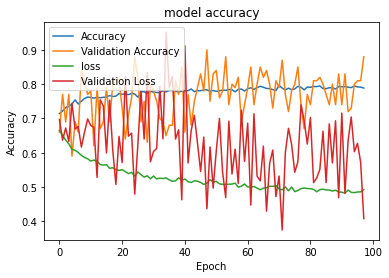

In [11]:
plt.plot(history.history["accuracy"])
plt.plot(history.history['val_accuracy'])
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title("model accuracy")
plt.ylabel("Accuracy")
plt.xlabel("Epoch")
plt.legend(["Accuracy","Validation Accuracy","loss","Validation Loss"])
plt.show()

In [34]:
ORIGINAL = r"C:\Users\smonn\Desktop\T8-AI&BigData_pdf\val\NORMAL\NORMAL2-IM-1427-0001.jpeg"

img = image.load_img(ORIGINAL, target_size=(DIM, DIM))

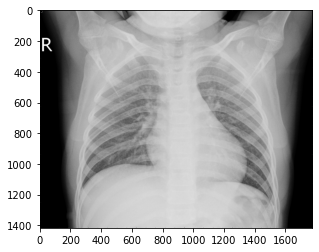

In [35]:
plt.imshow(cv2.imread(ORIGINAL))
plt.show()

In [36]:
# Prédiction d'images
x = image.img_to_array(img)
x = np.expand_dims(x, axis=0)
images = np.vstack([x])
classes = np.argmax(InceptionResNetV2_model.predict(images, batch_size=10), axis=-1)
print("La classe prédite est :",classes)

La classe prédite est : [2]


In [37]:
with tf.GradientTape() as tape:
  last_conv_layer = InceptionResNetV2_model.get_layer('conv_7b_ac')
  iterate = tf.keras.models.Model([InceptionResNetV2_model.inputs], [InceptionResNetV2_model.output, last_conv_layer.output])
  model_out, last_conv_layer = iterate(x)
  class_out = model_out[:, np.argmax(model_out[0])]
  grads = tape.gradient(class_out, last_conv_layer)
  pooled_grads = K.mean(grads, axis=(0, 1, 2))
  
heatmap = tf.reduce_mean(tf.multiply(pooled_grads, last_conv_layer), axis=-1)

(1, 8, 8)


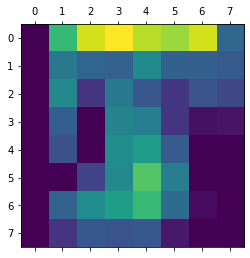

In [38]:
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
print(heatmap.shape)
heatmap = heatmap.reshape((8, 8))
plt.matshow(heatmap)
plt.show()

In [39]:
img = cv2.imread(ORIGINAL)

In [40]:
INTENSITY = 0.5

heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

heatmap = cv2.applyColorMap(np.uint8(255*heatmap), cv2.COLORMAP_JET)

img = heatmap * INTENSITY + img

In [41]:
plt.figure(figsize=(DIM, DIM))
plt.imshow(cv2.imread(ORIGINAL))
plt.show()

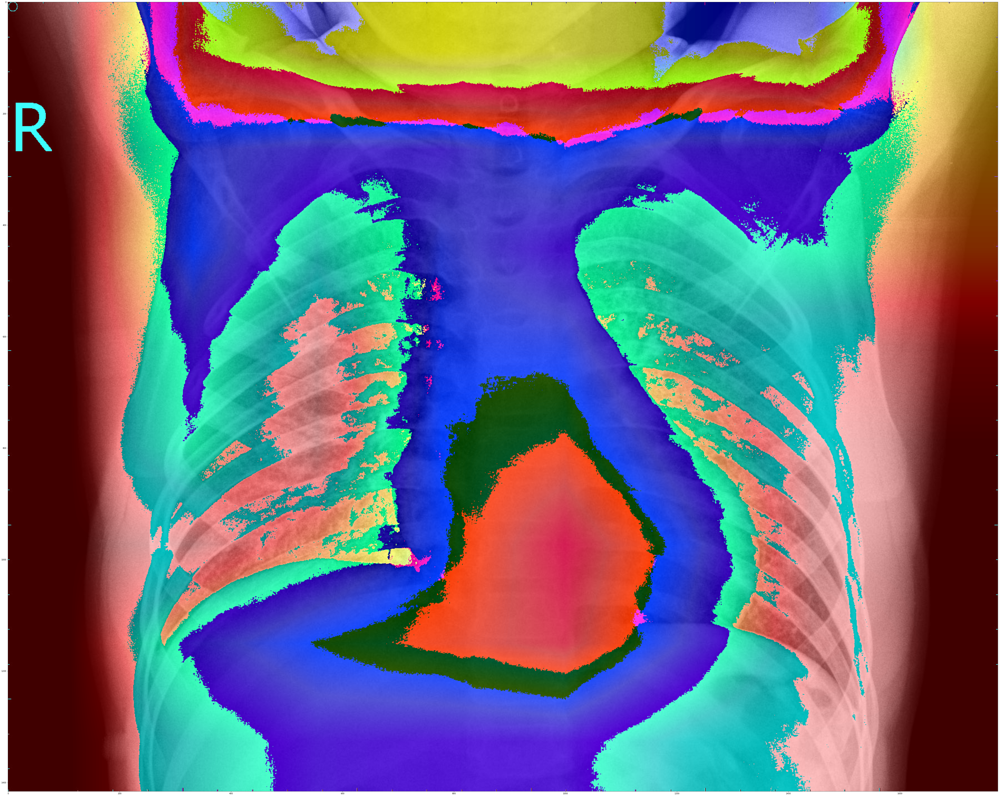

In [42]:
plt.figure(figsize=(90, 90))
plt.imshow(np.uint8(img))

plt.show()

In [44]:
InceptionResNetV2_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 244, 244, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 121, 121, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 121, 121, 32  96         ['conv2d[0][0]']                 
 alization)                     )                                                             

 batch_normalization_5 (BatchNo  (None, 28, 28, 96)  288         ['conv2d_5[0][0]']               
 rmalization)                                                                                     
                                                                                                  
 batch_normalization_7 (BatchNo  (None, 28, 28, 64)  192         ['conv2d_7[0][0]']               
 rmalization)                                                                                     
                                                                                                  
 batch_normalization_10 (BatchN  (None, 28, 28, 96)  288         ['conv2d_10[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 batch_normalization_11 (BatchN  (None, 28, 28, 64)  192         ['conv2d_11[0][0]']              
 ormalizat

 activation_21 (Activation)     (None, 28, 28, 32)   0           ['batch_normalization_21[0][0]'] 
                                                                                                  
 conv2d_19 (Conv2D)             (None, 28, 28, 32)   10240       ['block35_1_ac[0][0]']           
                                                                                                  
 conv2d_22 (Conv2D)             (None, 28, 28, 48)   13824       ['activation_21[0][0]']          
                                                                                                  
 batch_normalization_19 (BatchN  (None, 28, 28, 32)  96          ['conv2d_19[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 batch_normalization_22 (BatchN  (None, 28, 28, 48)  144         ['conv2d_22[0][0]']              
 ormalizat

                                                                                                  
 activation_24 (Activation)     (None, 28, 28, 32)   0           ['batch_normalization_24[0][0]'] 
                                                                                                  
 activation_26 (Activation)     (None, 28, 28, 32)   0           ['batch_normalization_26[0][0]'] 
                                                                                                  
 activation_29 (Activation)     (None, 28, 28, 64)   0           ['batch_normalization_29[0][0]'] 
                                                                                                  
 block35_3_mixed (Concatenate)  (None, 28, 28, 128)  0           ['activation_24[0][0]',          
                                                                  'activation_26[0][0]',          
                                                                  'activation_29[0][0]']          
          

 ormalization)                                                                                    
                                                                                                  
 batch_normalization_40 (BatchN  (None, 28, 28, 48)  144         ['conv2d_40[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_37 (Activation)     (None, 28, 28, 32)   0           ['batch_normalization_37[0][0]'] 
                                                                                                  
 activation_40 (Activation)     (None, 28, 28, 48)   0           ['batch_normalization_40[0][0]'] 
                                                                                                  
 conv2d_36 (Conv2D)             (None, 28, 28, 32)   10240       ['block35_4_ac[0][0]']           
          

 block35_6_mixed (Concatenate)  (None, 28, 28, 128)  0           ['activation_42[0][0]',          
                                                                  'activation_44[0][0]',          
                                                                  'activation_47[0][0]']          
                                                                                                  
 block35_6_conv (Conv2D)        (None, 28, 28, 320)  41280       ['block35_6_mixed[0][0]']        
                                                                                                  
 block35_6 (Lambda)             (None, 28, 28, 320)  0           ['block35_5_ac[0][0]',           
                                                                  'block35_6_conv[0][0]']         
                                                                                                  
 block35_6_ac (Activation)      (None, 28, 28, 320)  0           ['block35_6[0][0]']              
          

 activation_58 (Activation)     (None, 28, 28, 48)   0           ['batch_normalization_58[0][0]'] 
                                                                                                  
 conv2d_54 (Conv2D)             (None, 28, 28, 32)   10240       ['block35_7_ac[0][0]']           
                                                                                                  
 conv2d_56 (Conv2D)             (None, 28, 28, 32)   9216        ['activation_55[0][0]']          
                                                                                                  
 conv2d_59 (Conv2D)             (None, 28, 28, 64)   27648       ['activation_58[0][0]']          
                                                                                                  
 batch_normalization_54 (BatchN  (None, 28, 28, 32)  96          ['conv2d_54[0][0]']              
 ormalization)                                                                                    
          

                                                                  'block35_9_conv[0][0]']         
                                                                                                  
 block35_9_ac (Activation)      (None, 28, 28, 320)  0           ['block35_9[0][0]']              
                                                                                                  
 conv2d_69 (Conv2D)             (None, 28, 28, 32)   10240       ['block35_9_ac[0][0]']           
                                                                                                  
 batch_normalization_69 (BatchN  (None, 28, 28, 32)  96          ['conv2d_69[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_69 (Activation)     (None, 28, 28, 32)   0           ['batch_normalization_69[0][0]'] 
          

 activation_75 (Activation)     (None, 13, 13, 384)  0           ['batch_normalization_75[0][0]'] 
                                                                                                  
 max_pooling2d_2 (MaxPooling2D)  (None, 13, 13, 320)  0          ['block35_10_ac[0][0]']          
                                                                                                  
 mixed_6a (Concatenate)         (None, 13, 13, 1088  0           ['activation_72[0][0]',          
                                )                                 'activation_75[0][0]',          
                                                                  'max_pooling2d_2[0][0]']        
                                                                                                  
 conv2d_77 (Conv2D)             (None, 13, 13, 128)  139264      ['mixed_6a[0][0]']               
                                                                                                  
 batch_nor

                                )                                 'block17_2_conv[0][0]']         
                                                                                                  
 block17_2_ac (Activation)      (None, 13, 13, 1088  0           ['block17_2[0][0]']              
                                )                                                                 
                                                                                                  
 conv2d_85 (Conv2D)             (None, 13, 13, 128)  139264      ['block17_2_ac[0][0]']           
                                                                                                  
 batch_normalization_85 (BatchN  (None, 13, 13, 128)  384        ['conv2d_85[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activatio

                                )                                                                 
                                                                                                  
 conv2d_93 (Conv2D)             (None, 13, 13, 128)  139264      ['block17_4_ac[0][0]']           
                                                                                                  
 batch_normalization_93 (BatchN  (None, 13, 13, 128)  384        ['conv2d_93[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_93 (Activation)     (None, 13, 13, 128)  0           ['batch_normalization_93[0][0]'] 
                                                                                                  
 conv2d_94 (Conv2D)             (None, 13, 13, 160)  143360      ['activation_93[0][0]']          
          

                                                                                                  
 batch_normalization_101 (Batch  (None, 13, 13, 128)  384        ['conv2d_101[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_101 (Activation)    (None, 13, 13, 128)  0           ['batch_normalization_101[0][0]']
                                                                                                  
 conv2d_102 (Conv2D)            (None, 13, 13, 160)  143360      ['activation_101[0][0]']         
                                                                                                  
 batch_normalization_102 (Batch  (None, 13, 13, 160)  480        ['conv2d_102[0][0]']             
 Normalization)                                                                                   
          

                                                                                                  
 activation_109 (Activation)    (None, 13, 13, 128)  0           ['batch_normalization_109[0][0]']
                                                                                                  
 conv2d_110 (Conv2D)            (None, 13, 13, 160)  143360      ['activation_109[0][0]']         
                                                                                                  
 batch_normalization_110 (Batch  (None, 13, 13, 160)  480        ['conv2d_110[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_110 (Activation)    (None, 13, 13, 160)  0           ['batch_normalization_110[0][0]']
                                                                                                  
 conv2d_10

 conv2d_118 (Conv2D)            (None, 13, 13, 160)  143360      ['activation_117[0][0]']         
                                                                                                  
 batch_normalization_118 (Batch  (None, 13, 13, 160)  480        ['conv2d_118[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_118 (Activation)    (None, 13, 13, 160)  0           ['batch_normalization_118[0][0]']
                                                                                                  
 conv2d_116 (Conv2D)            (None, 13, 13, 192)  208896      ['block17_10_ac[0][0]']          
                                                                                                  
 conv2d_119 (Conv2D)            (None, 13, 13, 192)  215040      ['activation_118[0][0]']         
          

 Normalization)                                                                                   
                                                                                                  
 activation_126 (Activation)    (None, 13, 13, 160)  0           ['batch_normalization_126[0][0]']
                                                                                                  
 conv2d_124 (Conv2D)            (None, 13, 13, 192)  208896      ['block17_12_ac[0][0]']          
                                                                                                  
 conv2d_127 (Conv2D)            (None, 13, 13, 192)  215040      ['activation_126[0][0]']         
                                                                                                  
 batch_normalization_124 (Batch  (None, 13, 13, 192)  576        ['conv2d_124[0][0]']             
 Normalization)                                                                                   
          

                                                                                                  
 conv2d_132 (Conv2D)            (None, 13, 13, 192)  208896      ['block17_14_ac[0][0]']          
                                                                                                  
 conv2d_135 (Conv2D)            (None, 13, 13, 192)  215040      ['activation_134[0][0]']         
                                                                                                  
 batch_normalization_132 (Batch  (None, 13, 13, 192)  576        ['conv2d_132[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 batch_normalization_135 (Batch  (None, 13, 13, 192)  576        ['conv2d_135[0][0]']             
 Normalization)                                                                                   
          

 conv2d_143 (Conv2D)            (None, 13, 13, 192)  215040      ['activation_142[0][0]']         
                                                                                                  
 batch_normalization_140 (Batch  (None, 13, 13, 192)  576        ['conv2d_140[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 batch_normalization_143 (Batch  (None, 13, 13, 192)  576        ['conv2d_143[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_140 (Activation)    (None, 13, 13, 192)  0           ['batch_normalization_140[0][0]']
                                                                                                  
 activatio

 Normalization)                                                                                   
                                                                                                  
 batch_normalization_151 (Batch  (None, 13, 13, 192)  576        ['conv2d_151[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_148 (Activation)    (None, 13, 13, 192)  0           ['batch_normalization_148[0][0]']
                                                                                                  
 activation_151 (Activation)    (None, 13, 13, 192)  0           ['batch_normalization_151[0][0]']
                                                                                                  
 block17_19_mixed (Concatenate)  (None, 13, 13, 384)  0          ['activation_148[0][0]',         
          

 activation_156 (Activation)    (None, 13, 13, 256)  0           ['batch_normalization_156[0][0]']
                                                                                                  
 activation_158 (Activation)    (None, 13, 13, 256)  0           ['batch_normalization_158[0][0]']
                                                                                                  
 activation_161 (Activation)    (None, 13, 13, 288)  0           ['batch_normalization_161[0][0]']
                                                                                                  
 conv2d_157 (Conv2D)            (None, 6, 6, 384)    884736      ['activation_156[0][0]']         
                                                                                                  
 conv2d_159 (Conv2D)            (None, 6, 6, 288)    663552      ['activation_158[0][0]']         
                                                                                                  
 conv2d_16

                                                                                                  
 activation_169 (Activation)    (None, 6, 6, 224)    0           ['batch_normalization_169[0][0]']
                                                                                                  
 conv2d_167 (Conv2D)            (None, 6, 6, 192)    399360      ['block8_1_ac[0][0]']            
                                                                                                  
 conv2d_170 (Conv2D)            (None, 6, 6, 256)    172032      ['activation_169[0][0]']         
                                                                                                  
 batch_normalization_167 (Batch  (None, 6, 6, 192)   576         ['conv2d_167[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 batch_nor

 batch_normalization_175 (Batch  (None, 6, 6, 192)   576         ['conv2d_175[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 batch_normalization_178 (Batch  (None, 6, 6, 256)   768         ['conv2d_178[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_175 (Activation)    (None, 6, 6, 192)    0           ['batch_normalization_175[0][0]']
                                                                                                  
 activation_178 (Activation)    (None, 6, 6, 256)    0           ['batch_normalization_178[0][0]']
                                                                                                  
 block8_4_

                                                                                                  
 activation_186 (Activation)    (None, 6, 6, 256)    0           ['batch_normalization_186[0][0]']
                                                                                                  
 block8_6_mixed (Concatenate)   (None, 6, 6, 448)    0           ['activation_183[0][0]',         
                                                                  'activation_186[0][0]']         
                                                                                                  
 block8_6_conv (Conv2D)         (None, 6, 6, 2080)   933920      ['block8_6_mixed[0][0]']         
                                                                                                  
 block8_6 (Lambda)              (None, 6, 6, 2080)   0           ['block8_5_ac[0][0]',            
                                                                  'block8_6_conv[0][0]']          
          

                                                                                                  
 block8_8 (Lambda)              (None, 6, 6, 2080)   0           ['block8_7_ac[0][0]',            
                                                                  'block8_8_conv[0][0]']          
                                                                                                  
 block8_8_ac (Activation)       (None, 6, 6, 2080)   0           ['block8_8[0][0]']               
                                                                                                  
 conv2d_196 (Conv2D)            (None, 6, 6, 192)    399360      ['block8_8_ac[0][0]']            
                                                                                                  
 batch_normalization_196 (Batch  (None, 6, 6, 192)   576         ['conv2d_196[0][0]']             
 Normalization)                                                                                   
          

 )                                                                                                
                                                                                                  
 conv_7b_ac (Activation)        (None, 6, 6, 1536)   0           ['conv_7b_bn[0][0]']             
                                                                                                  
 flatten (Flatten)              (None, 55296)        0           ['conv_7b_ac[0][0]']             
                                                                                                  
 dense (Dense)                  (None, 3)            165891      ['flatten[0][0]']                
                                                                                                  
Total params: 54,502,627
Trainable params: 165,891
Non-trainable params: 54,336,736
__________________________________________________________________________________________________
